# SpatialMouse: DEG analysis

In [1]:
## The following code ensures that all functions and init files are reloaded before executions.
%load_ext autoreload
%autoreload 2

In [2]:
## Import the custom library
import os
import sys

# add xDbit toolbox path to path variable
module_path = os.path.abspath("../../")
if module_path not in sys.path:
    sys.path.append(module_path)

import dbitx_funcs as db

In [3]:
import scanpy as sc
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from glob import glob
from pathlib import Path
import seaborn as sns
import gc
import anndata

In [4]:
plt.rcParams['figure.dpi'] = 100
plt.style.use('default')

## Read data

### Get input files

In [5]:
# input file parameters
input_dir = "out/" # input directory
input_file_pattern = "pp_wohires.h5ad" # pattern in input files

# search for input files
input_files = [elem for elem in glob(os.path.join(input_dir, "*.h5ad")) if input_file_pattern in elem]

### Read files

In [6]:
adatas = {os.path.basename(file).split("_")[0]: sc.read(file) for file in input_files}

In [7]:
# due to a scanpy bug this line has to be added. See: https://github.com/theislab/single-cell-tutorial/issues/97
for adata in adatas.values():
    if "base" not in adata.uns['log1p'].keys():
        adata.uns['log1p']["base"] = None

# DEG analysis

Here we perform the DEG analysis per organ and per leiden cluster.

In [8]:
for organ, adata in adatas.items():
    print('Processing {}'.format(organ))
    sc.tl.rank_genes_groups(adata, groupby='leiden', method='wilcoxon', key_added='deg_leiden')

Processing Brain
Processing Heart
Processing Kidney
Processing Liver
Processing Spleen


Brain


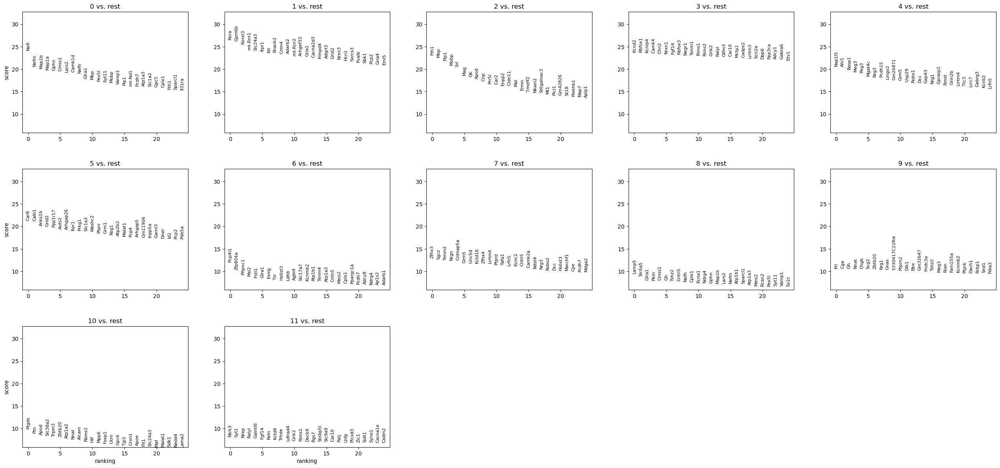

Heart


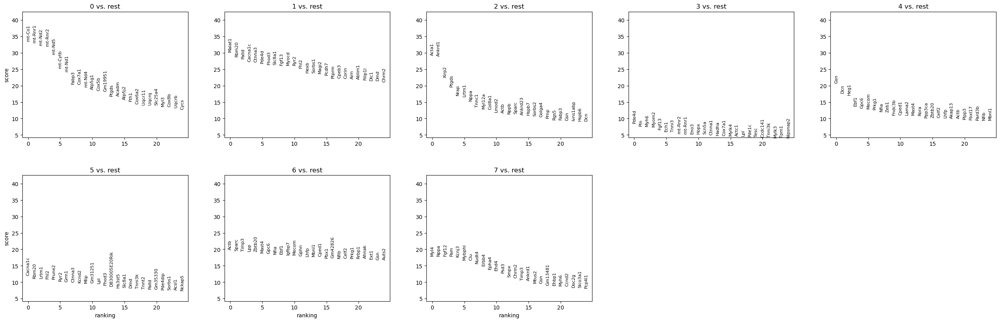

Kidney


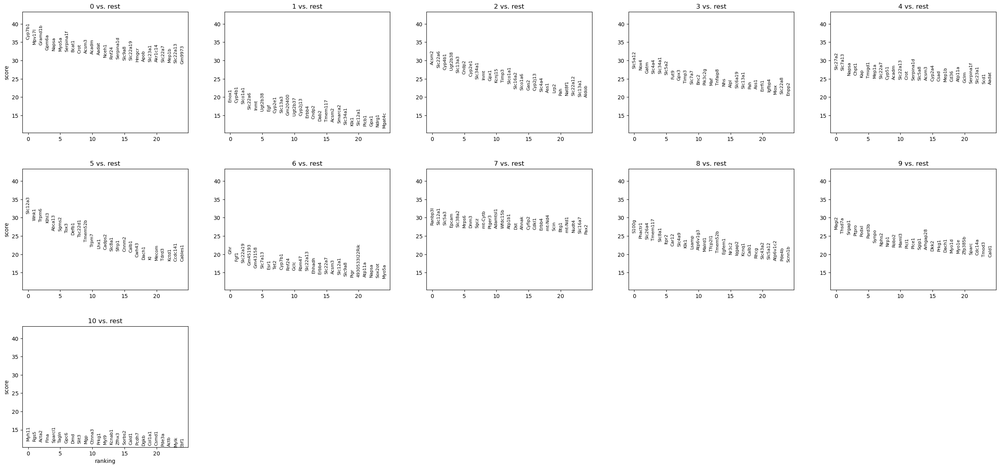

Liver


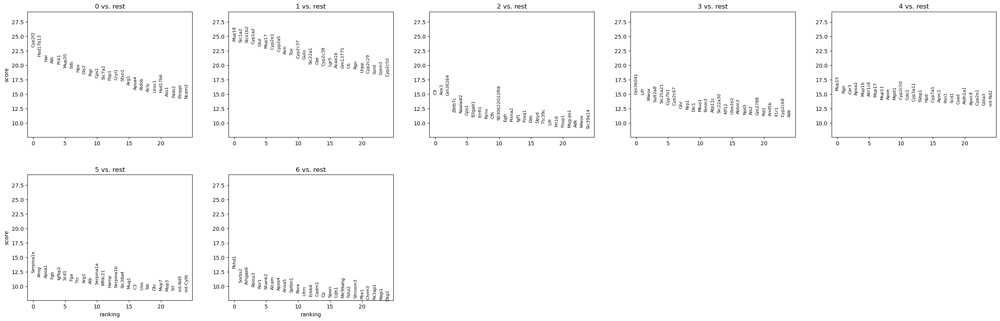

Spleen


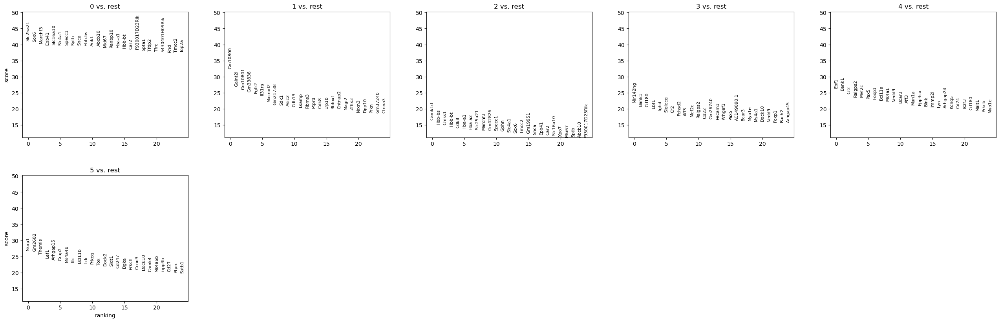

In [9]:
for organ, adata in adatas.items():
    print(organ)
    sc.pl.rank_genes_groups(adata, n_genes=25, sharey=True, key='deg_leiden', ncols=5)

Brain


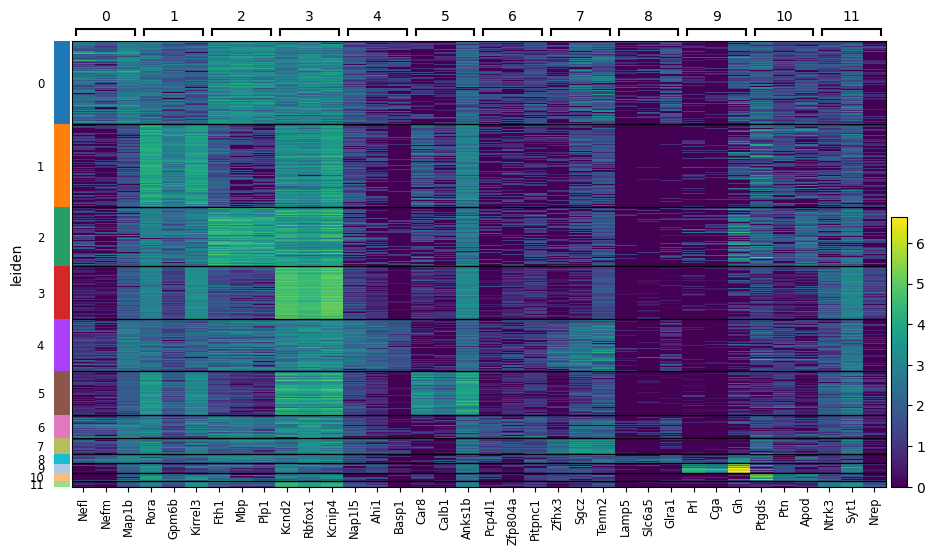

Heart


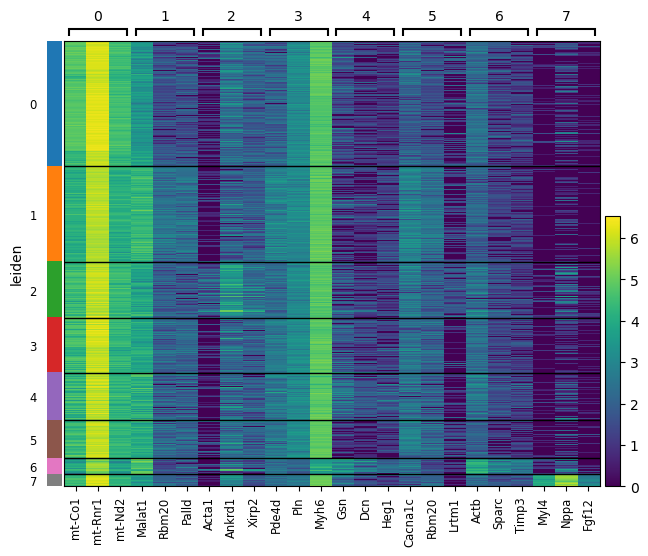

Kidney


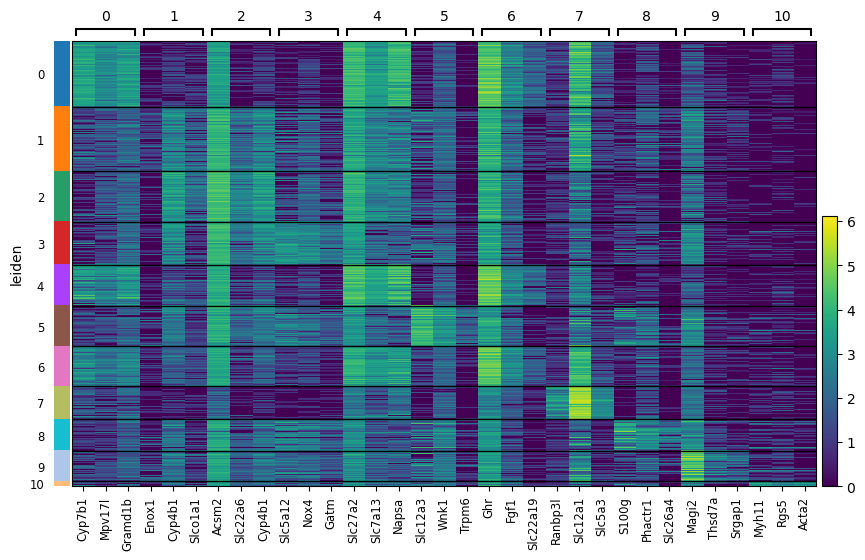

Liver


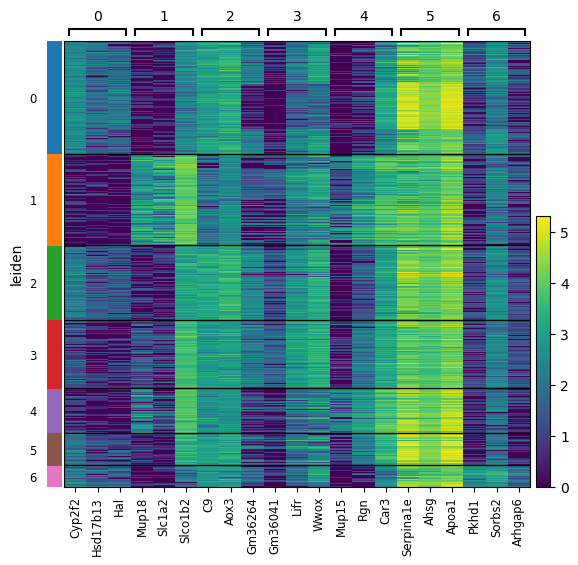

Spleen


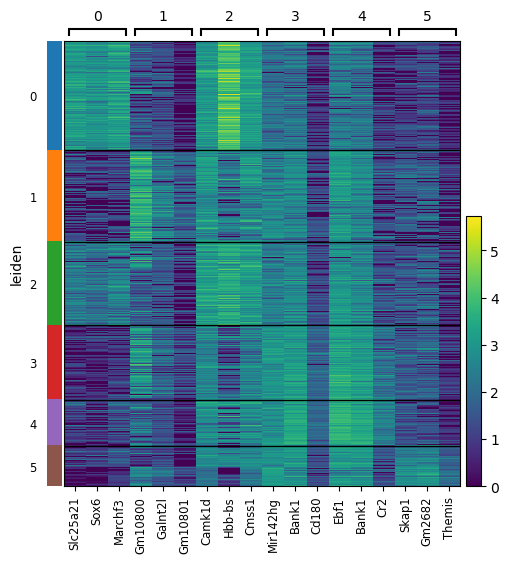

In [10]:
for organ, adata in adatas.items():
    print(organ)
    sc.pl.rank_genes_groups_heatmap(adata, n_genes=3, key='deg_leiden', dendrogram=False)

# DEGs of coarse leiden clustering

In [11]:
res = 0.3
for organ, adata in adatas.items():
    sc.tl.leiden(adata, resolution=res, key_added='leiden_coarse')

Brain


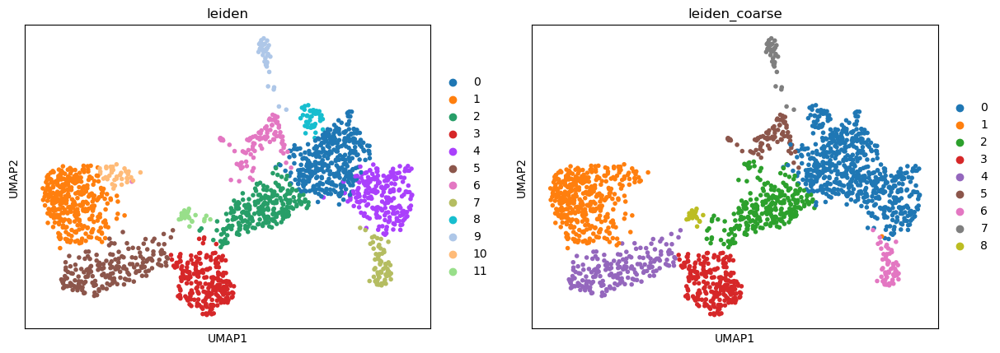

Heart


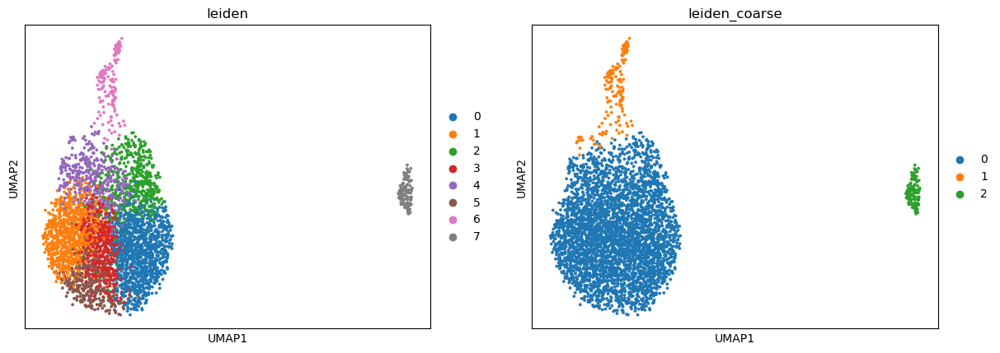

Kidney


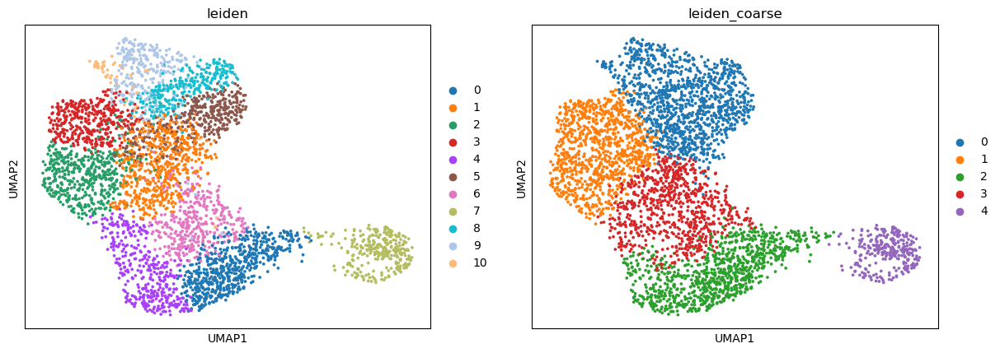

Liver


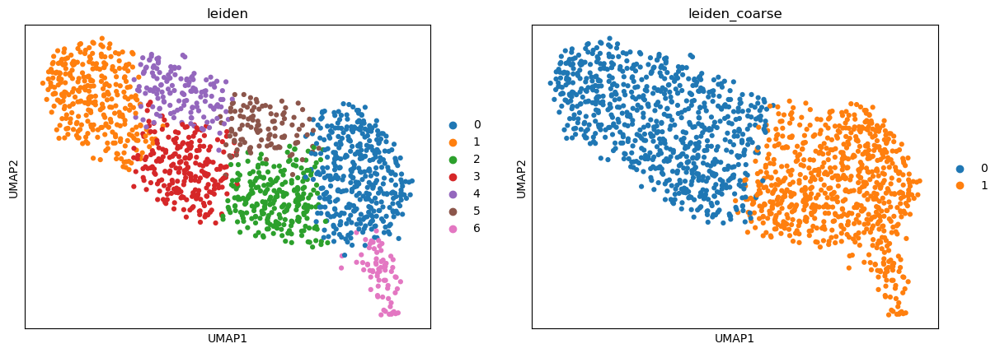

Spleen


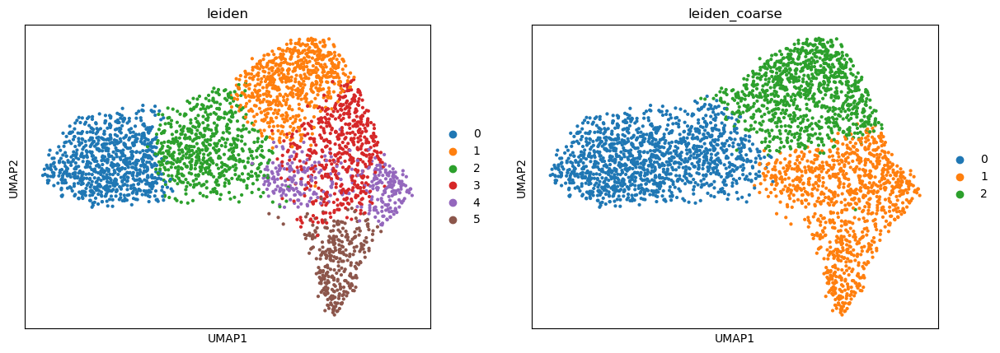

In [12]:
for organ, adata in adatas.items():
    print(organ)
    sc.pl.umap(adata, color=['leiden', 'leiden_coarse'])

In [13]:
for organ, adata in adatas.items():
    with plt.rc_context({"figure.dpi": (600)}):
        sc.pl.umap(adata, color=['leiden_coarse'], save="_{}_leiden_coarse.png".format(organ), show=False)

In [14]:
for organ, adata in adatas.items():
    print('Processing {}'.format(organ))
    sc.tl.rank_genes_groups(adata, groupby='leiden_coarse', method='wilcoxon', key_added='deg_leiden_coarse')

Processing Brain
Processing Heart
Processing Kidney
Processing Liver
Processing Spleen


# Plotting

## Top DEGs

Brain


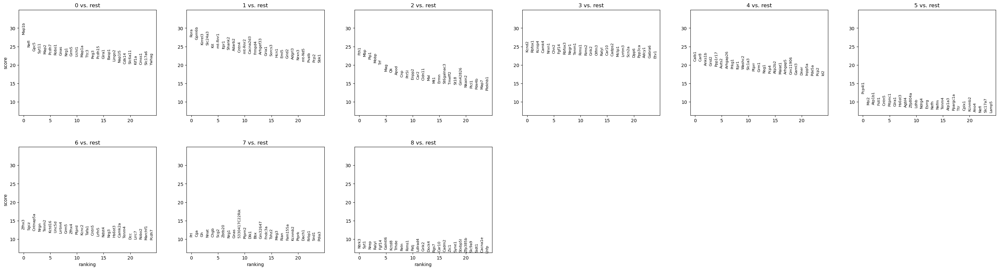

Heart


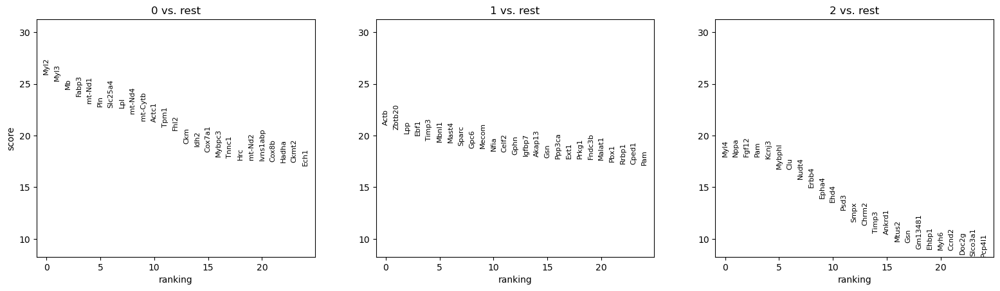

Kidney


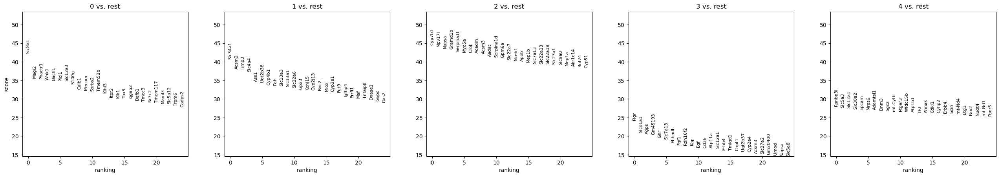

Liver


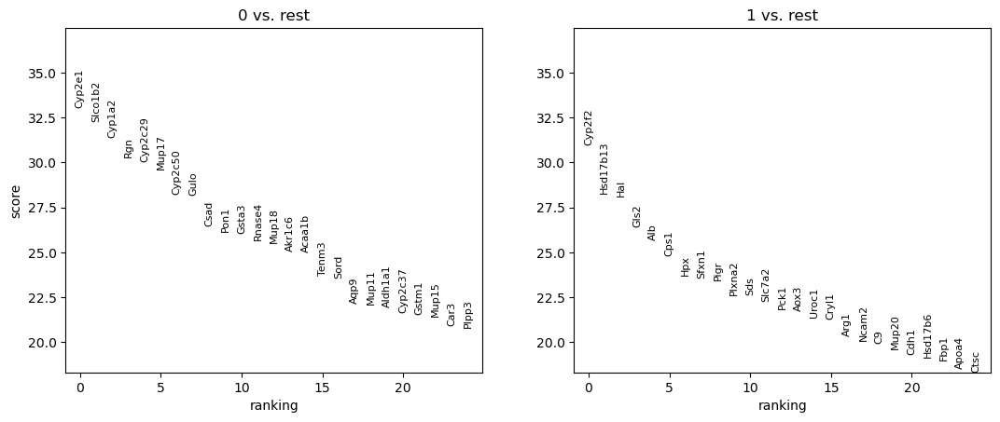

Spleen


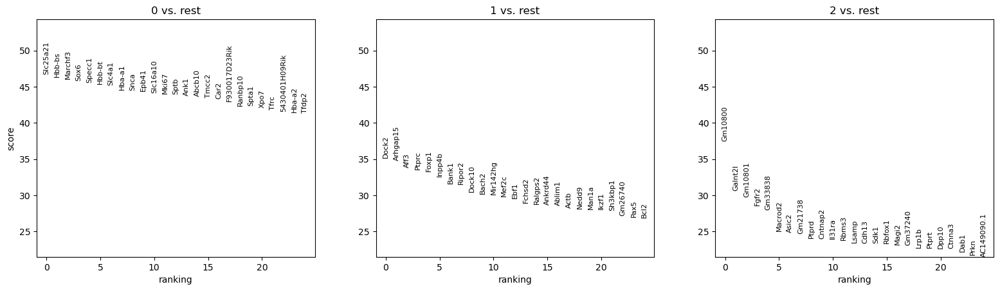

In [15]:
for organ, adata in adatas.items():
    print(organ)
    sc.pl.rank_genes_groups(adata, n_genes=25, sharey=True, key='deg_leiden_coarse', ncols=6)

## Heatmaps

Brain


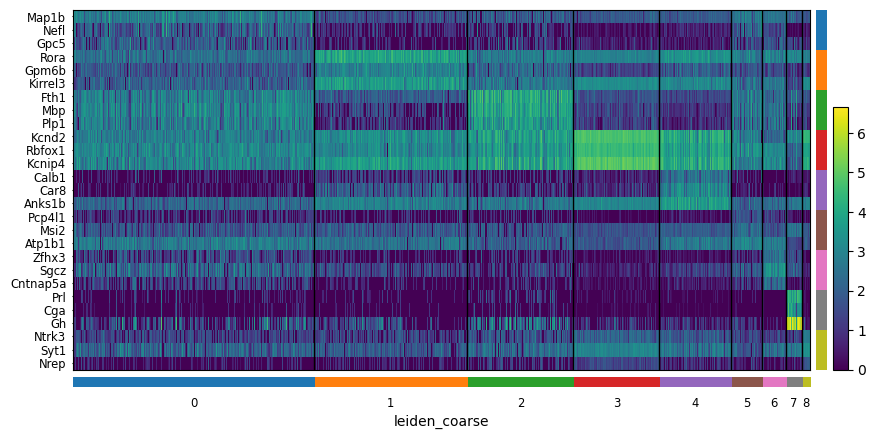

Heart


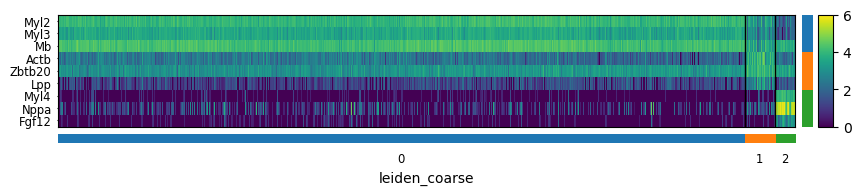

Kidney


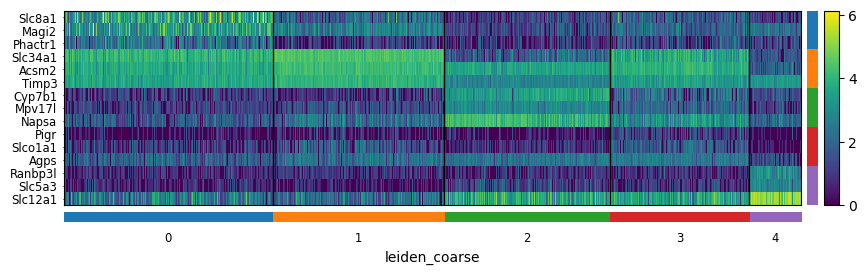

Liver


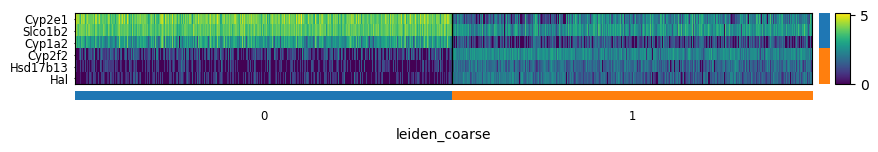

Spleen


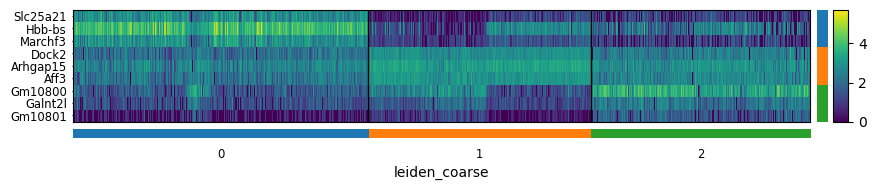

In [16]:
for organ, adata in adatas.items():
    print(organ)
    sc.pl.rank_genes_groups_heatmap(adata, n_genes=3, key='deg_leiden_coarse', dendrogram=False, swap_axes=True, 
                                    save="_leidencoarse_top3_{}.pdf".format(organ))

# Save results

In [17]:
output_files = [file.rsplit(".", 1)[0] + "_deg.h5ad" for file in input_files]

In [18]:
for organ, adata in adatas.items():
    outfile = [elem for elem in output_files if organ in elem][0]
    print("Saving {} adata to {}".format(organ, outfile))
    adata.write(outfile)

Saving Brain adata to out\Brain_adata_pp_wohires_deg.h5ad
Saving Heart adata to out\Heart_adata_pp_wohires_deg.h5ad
Saving Kidney adata to out\Kidney_adata_pp_wohires_deg.h5ad
Saving Liver adata to out\Liver_adata_pp_wohires_deg.h5ad
Saving Spleen adata to out\Spleen_adata_pp_wohires_deg.h5ad


# GO term analysis

Both GProfiler and StringDB are used here.

In [19]:
# extract deg keys
for elem in adatas['Kidney'].uns.keys():
    if elem.startswith('deg'):
        print(elem)

deg_leiden
deg_leiden_coarse


In [20]:
key = 'deg_leiden_coarse'

for organ, adata in adatas.items():
    print("Processing {}...".format(organ))
    go = db.tl.GOEnrichment()
    print("\t{}".format("Run GProfiler..."))
    go.gprofiler(adata, key=key, organism='mmusculus', return_df=False)
    print("\t{}".format("Run StringDB..."))
    go.stringdb(adata, key=key, organism='mmusculus', return_df=False)

Processing Brain...
	Run GProfiler...
	Run StringDB...
Processing Heart...
	Run GProfiler...
	Run StringDB...
Processing Kidney...
	Run GProfiler...
	Run StringDB...
Processing Liver...
	Run GProfiler...
	Run StringDB...
Processing Spleen...
	Run GProfiler...
	Run StringDB...


## Plotting GO results

Most interesting databases:
1. "TISSUES" (StringDB): The BRENDA Tissue Ontology (BTO)
2. "Process" (StringDB): GO Biological Process

Brain
Saving figure to file figures/dotplot_Brain_TISSUES_top8.pdf
Saved.


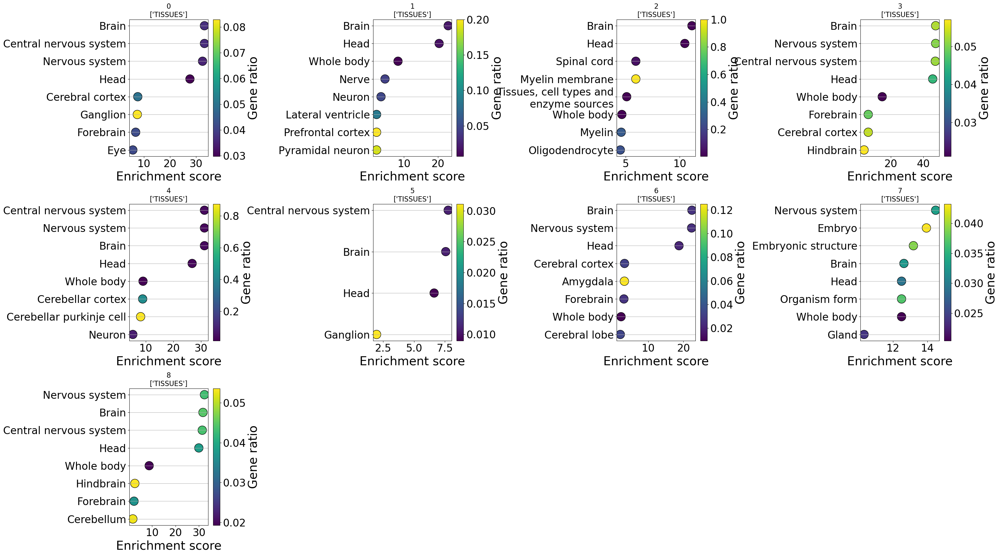

Heart
Saving figure to file figures/dotplot_Heart_TISSUES_top8.pdf
Saved.


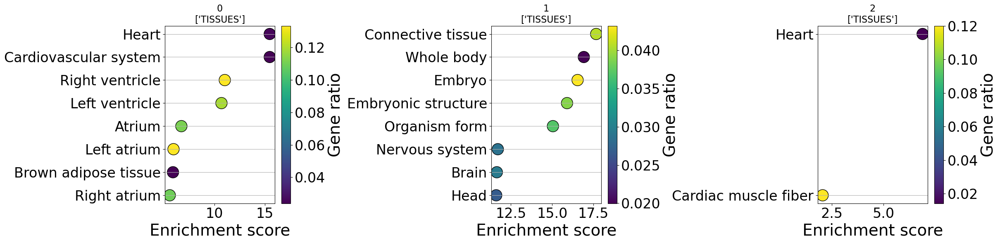

Kidney
Saving figure to file figures/dotplot_Kidney_TISSUES_top8.pdf
Saved.


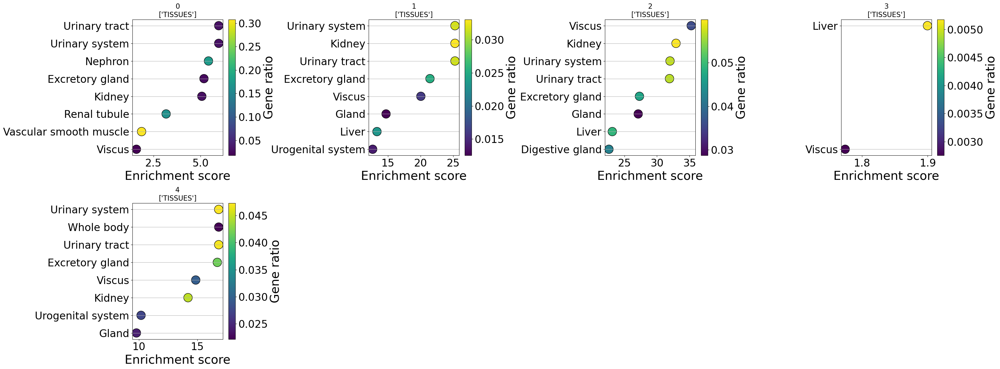

Liver
Saving figure to file figures/dotplot_Liver_TISSUES_top8.pdf
Saved.


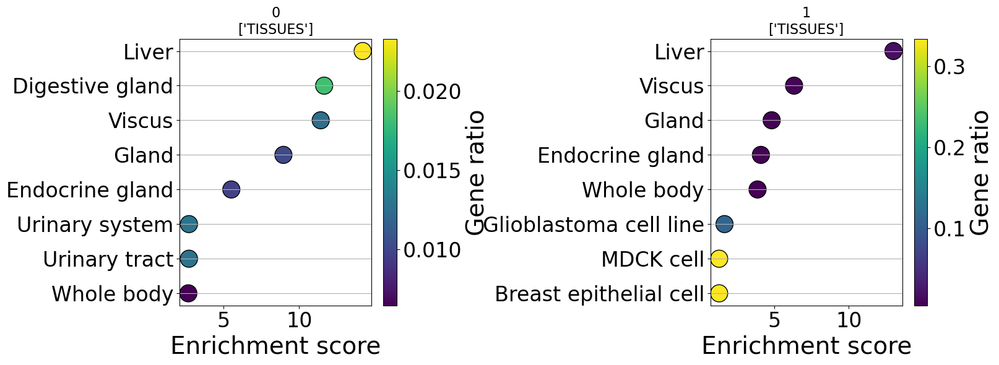

Spleen
Saving figure to file figures/dotplot_Spleen_TISSUES_top8.pdf
Saved.


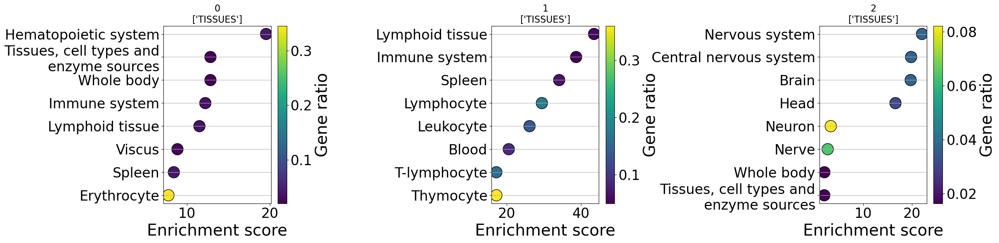

In [21]:
lib = 'TISSUES'
topn = 8

for organ, adata in adatas.items():
    print(organ)
    db.pl.go_dotplot(adata.uns['stringdb_enrichment']['deg_leiden_coarse'], 
                     libraries=lib, 
                     color_key='Gene ratio',
                     clb_norm=False,
                     figsize=(8,6),
                     max_to_plot=topn,
                     ytick_label_size=24, xtick_label_size=24, clb_tick_label_size=24,
                     ax_label_size=28, clb_label_size=28, 
                     markersize=400,
                     savepath="figures/dotplot_{}_{}_top{}.pdf".format(organ, lib, topn)
                    )

Brain
Saving figure to file figures/dotplot_Brain_Process_top5.pdf
Saved.


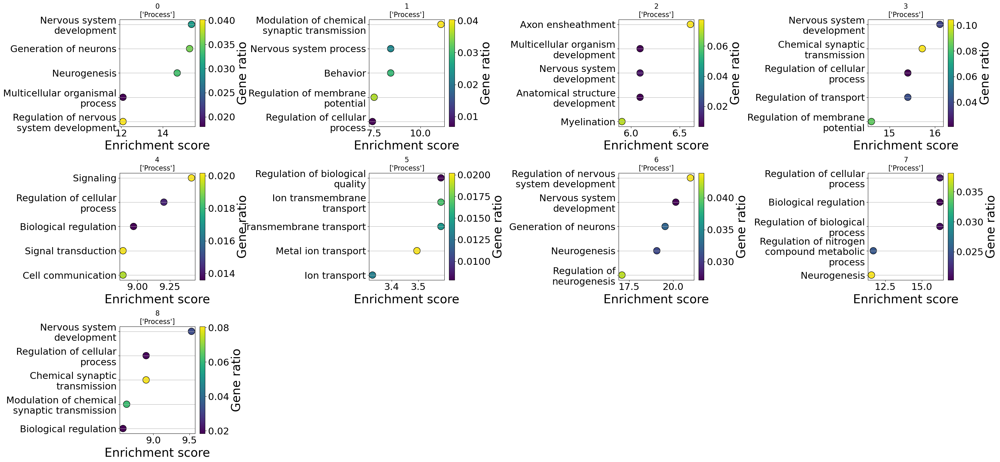

Heart
Saving figure to file figures/dotplot_Heart_Process_top5.pdf
Saved.


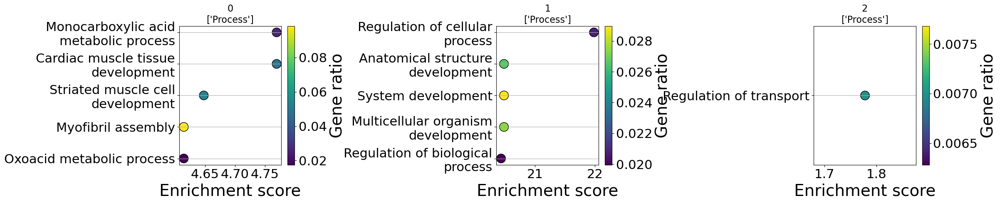

Kidney
Saving figure to file figures/dotplot_Kidney_Process_top5.pdf
Saved.


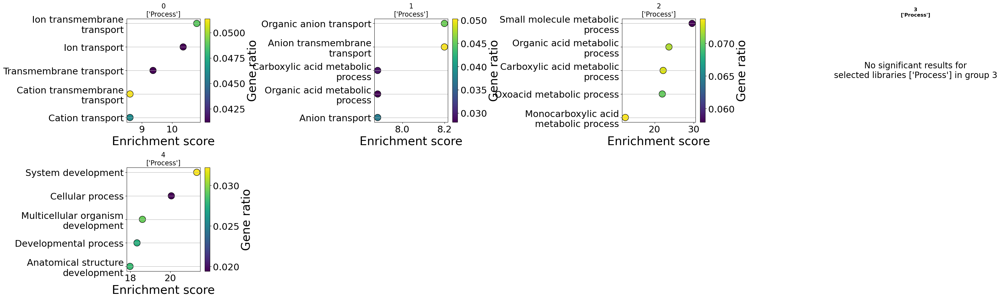

Liver
Saving figure to file figures/dotplot_Liver_Process_top5.pdf
Saved.


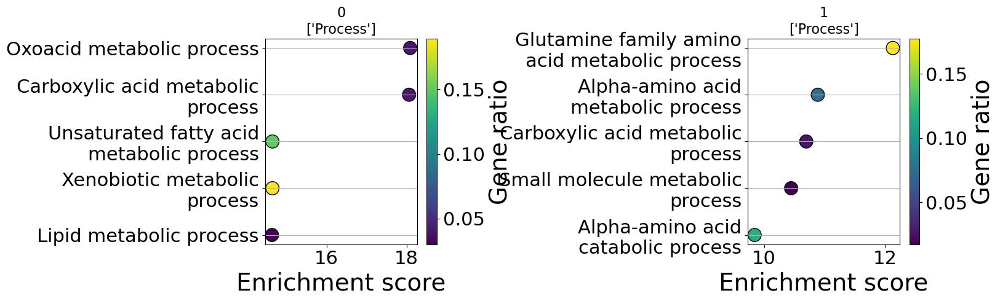

Spleen
Saving figure to file figures/dotplot_Spleen_Process_top5.pdf
Saved.


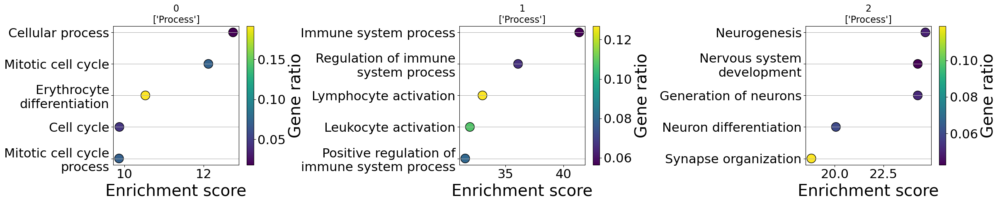

In [22]:
lib = 'Process'
topn = 5

for organ, adata in adatas.items():
    print(organ)
    db.pl.go_dotplot(adata.uns['stringdb_enrichment']['deg_leiden_coarse'], 
                     libraries=lib, 
                     color_key='Gene ratio',
                     clb_norm=False,
                     figsize=(8,5),
                     max_to_plot=topn,
                     ytick_label_size=22, xtick_label_size=22, clb_tick_label_size=22,
                     ax_label_size=28, clb_label_size=28, 
                     savepath="figures/dotplot_{}_{}_top{}.pdf".format(organ, lib, topn)
                    )

## Spatial plots

Saving figure to file figures/spatial_Brain_leiden_coarse.pdf
Saved.


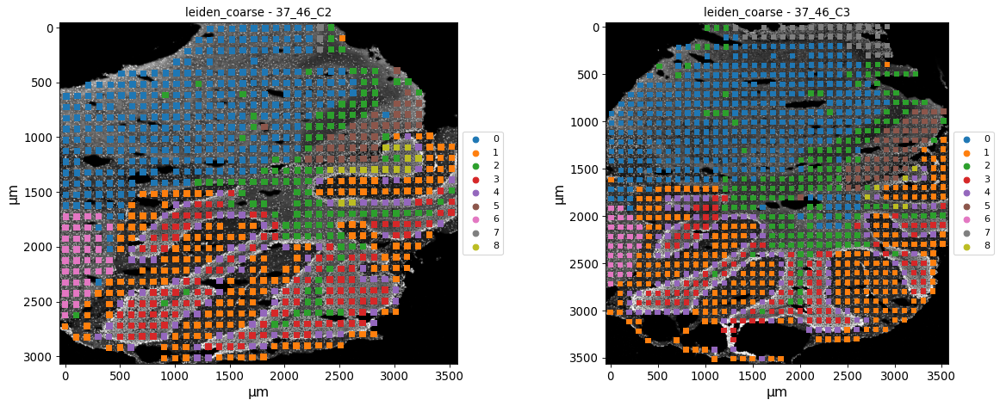

Saving figure to file figures/spatial_Heart_leiden_coarse.pdf
Saved.


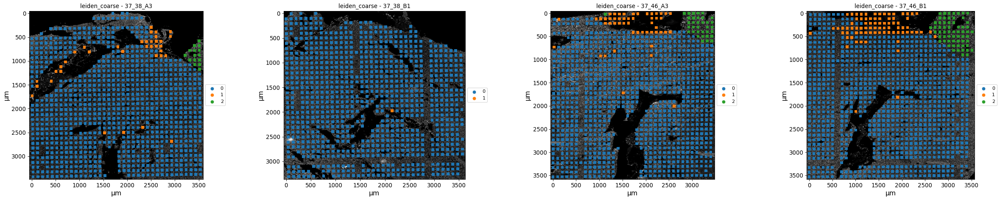

Saving figure to file figures/spatial_Kidney_leiden_coarse.pdf
Saved.


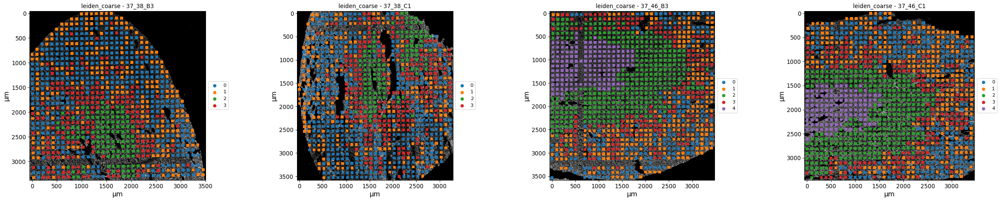

Saving figure to file figures/spatial_Liver_leiden_coarse.pdf
Saved.


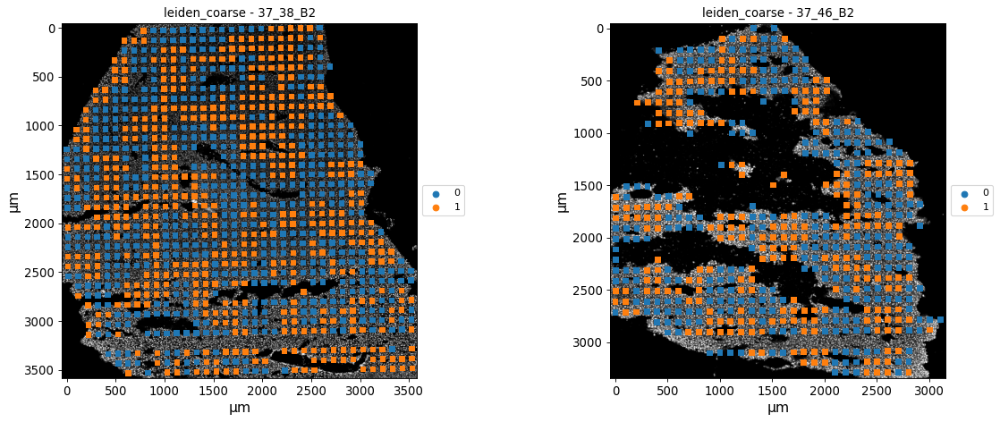

Saving figure to file figures/spatial_Spleen_leiden_coarse.pdf
Saved.


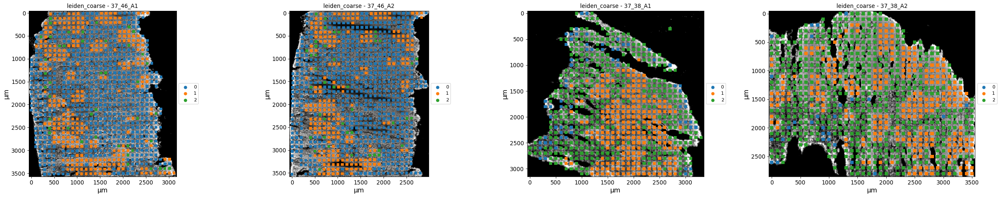

In [23]:
key='leiden_coarse'

for organ, adata in adatas.items():
    db.pl.spatial(adatas[organ], keys=key, groupby='id', 
                  image_key='dapi',
                  savepath="figures/spatial_{}_{}.pdf".format(organ, key)
                 )